In [634]:
import numpy as np
from matplotlib import pyplot as plt
import h5py
import os
import csv
import tifffile  # to load tiff files efficiently
import cv2 # Open-CV for selecting a ROI
import itertools #to flatten a list of list
import datetime
from datetime import datetime as dt
from datetime import time

from scipy.optimize import curve_fit

images = "C:\\Users\\QC\\OneDrive - UW-Madison\\Pictures\\Andor Luca images"

# origin's timestamps are in unix time times 2**32 and there seems to be
# a five hour offset. two years ago I observed a 6 hour offset, but they may
# have been a daylight savings time difference. also this issue doesn't arise
# when grabbing the data with the origin reader
origintime_to_dt = lambda x: dt.utcfromtimestamp(x/2**32 - 5*3600).strftime(
    '%m-%d %H:%M')

# consts
kB = 1.38e-23
mRb = 1.44316060e-25

In [399]:
def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    """
    a 2D Gaussian rotated at angle theta with standard deviation sigma_x, sigma_y.
    """
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()

## 2023.09.13

### estimate microns/pixel with known dimensions

In [559]:
filenames = [
            "MOTTemperature_size_reference.tif"
]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(images,f))
    for f in filenames
]))) # flattening tifstackList

TiffTag 4935: coercing invalid ASCII to bytes


In [560]:
tifstack.shape

(1002, 1004)

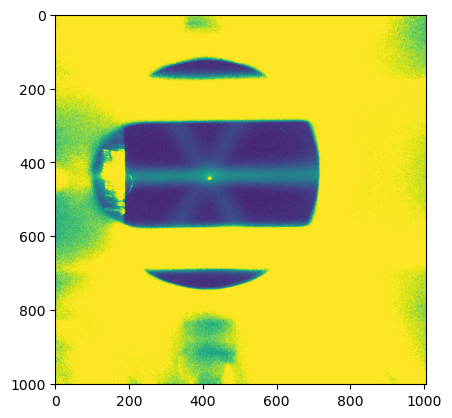

In [561]:
plt.imshow(tifstack)

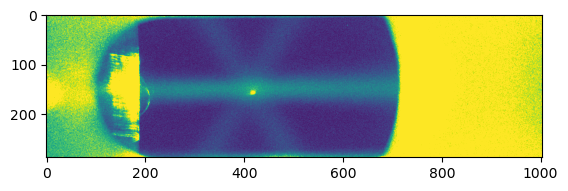

In [569]:
plt.imshow(tifstack[287:575])

In [591]:
pixels_per_um = (575-287)/5600 # the slot width is 5.6 mm
pixels_per_um, 1/pixels_per_um

(0.05142857142857143, 19.444444444444446)

In [592]:
ppm = lambda pixels: 1e-6*pixels/pixels_per_um # pixels per meter, not parts per million

### import time of flight data

In [642]:
filenames = [#"MOTTemperature_20230913_758.tif" # this file has images taken before the double pass is chopped off
             #"MOTTemperature_20230913_1216.tif" # for checking if 50 ms is a long enough drop time
             #"MOTTemperature_20230913_1222.tif" # don't trust this one.
             #"MOTTemperature_20230913_1222.tif"
#              "MOTTemperature_20230913_1606.tif" # turn off coils along with the beams, 3ms gap only. no MOT seen.
#              "MOTTemperature_20230913_1611.tif" # 2ms gap only
#              "MOTTemperature_20230913_1615.tif" # " but load MOT for 3s instead of 2s
#              "MOTTemperature_20230913_1629.tif" # Tx = 160 uK and Ty = 360 uK. [0.001, 1]*ms
              "MOTTemperature_20230913_1710.tif" # [0.001,0.5,1,1.5]*ms
]

timesteps = np.array([0.001,0.5,1,1.5])*ms
steps = len(timesteps)

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(images,f))
    for f in filenames
]))) # flattening tifstackList

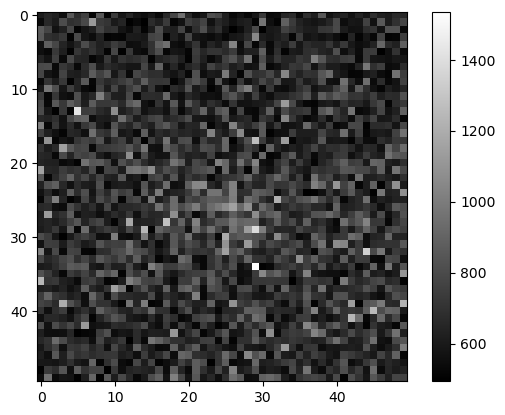

In [614]:
plt.imshow(tifstack[0][135:185,90:140], cmap='gray')
# print(np.mean(data))
plt.colorbar()
plt.show()

In [615]:
# crop the data

# the MOT showed up here this morning
# data = np.array([tifstack[0:][i][150:200,150:200] for i in range(tifstack.shape[0]) if not i % 2])
# control = np.array([tifstack[0:][i][150:200,150:200] for i in range(tifstack.shape[0]) if i % 2]) # there should always be a MOT here

# the MOT was here around noon. it has moved more than its full width but it could be the 
# camera drifting. i haven't checked
# data = np.array([tifstack[0:][i][160:210,130:180] for i in range(tifstack.shape[0]) if not i % 2])
# control = np.array([tifstack[0:][i][160:210,130:180] for i in range(tifstack.shape[0]) if i % 2]) # there should always be a MOT here

# if no control datapoints:
data = np.array([tifstack[0:][i][135:185,90:140] for i in range(tifstack.shape[0])])

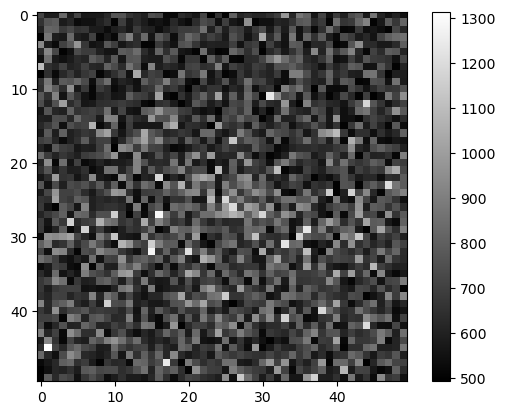

In [616]:
plt.imshow(data[1], cmap='gray')
# print(np.mean(data))
plt.colorbar()
plt.show()

737.9333274509804


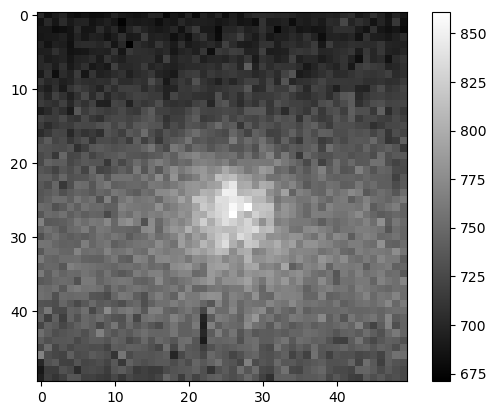

In [617]:
plt.imshow(np.mean(data,axis=0), cmap='gray')
print(np.mean(data))
plt.colorbar()
plt.show()

In [527]:
# for image in control:
#     plt.imshow(image, cmap='gray')
#     plt.show()

710.3469285714285


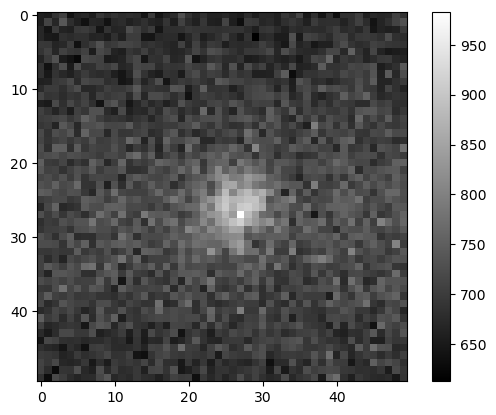

In [481]:
plt.imshow(np.mean(control,axis=0), cmap='gray')
print(np.mean(control))
plt.colorbar()
plt.show()

### test image data

In [368]:
filenames = ["MOTTemperature_test.tif" # this file has images taken before the double pass is chopped off
            ]

tifstack = np.array(list(itertools.chain(*[tifffile.imread(os.path.join(images,f))
    for f in filenames
]))) # flattening tifstackList

In [369]:
tifstack.shape

(61, 301, 401)

In [395]:
# crop the data
data = [tifstack[0:][i][150:200,150:200] for i in range(tifstack.shape[0]) if not i % 2]
control = [tifstack[0:][i][150:200,150:200] for i in range(tifstack.shape[0]) if i % 2] # there should always be a MOT here

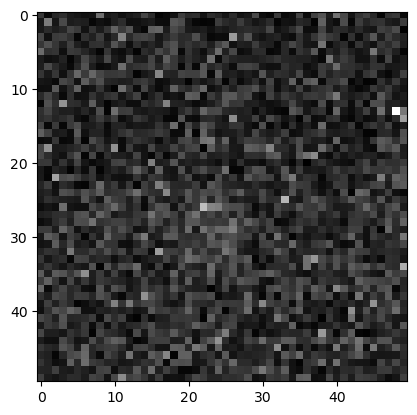

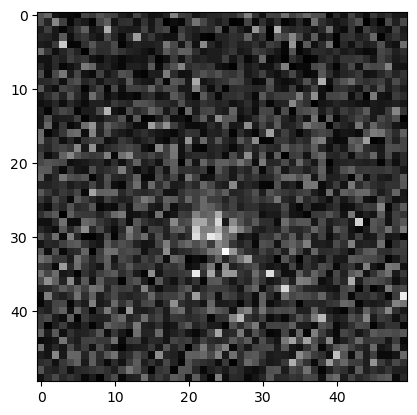

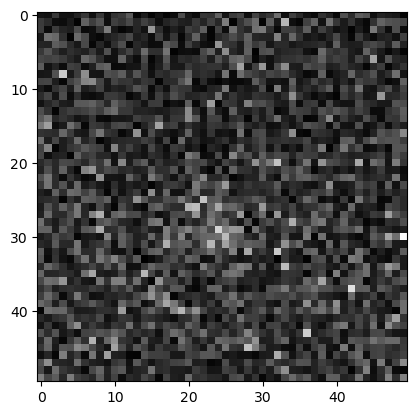

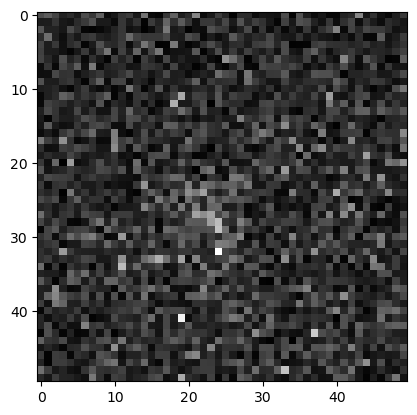

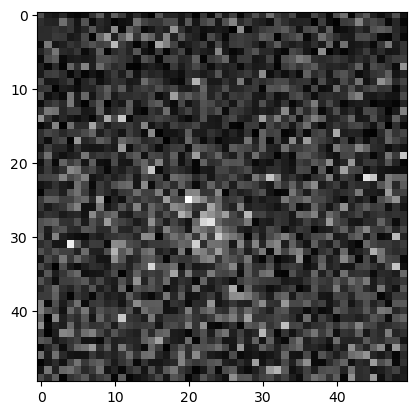

...

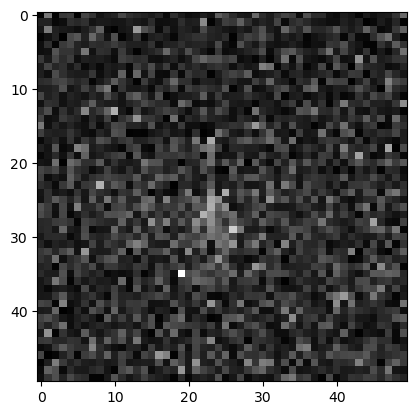

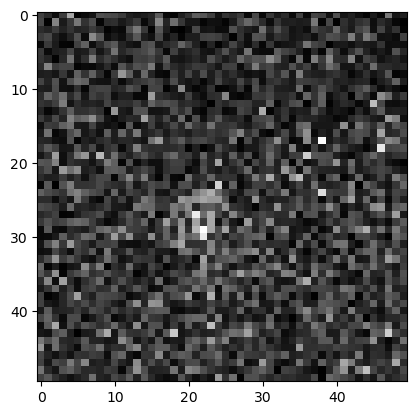

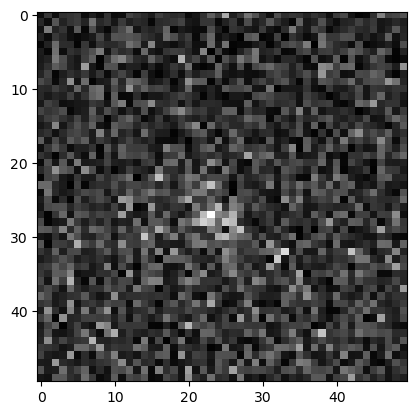

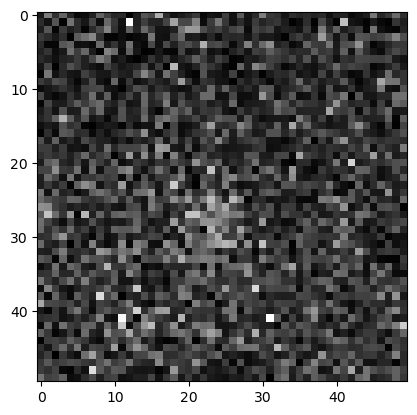

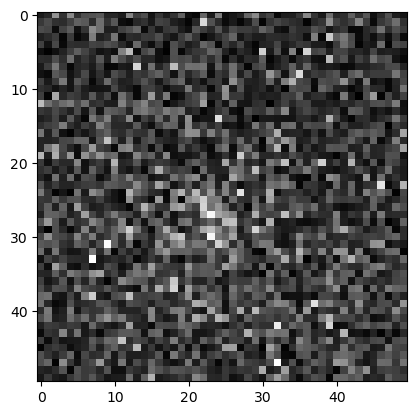

In [375]:
for image in data:
    plt.imshow(image, cmap='gray')
    plt.show()

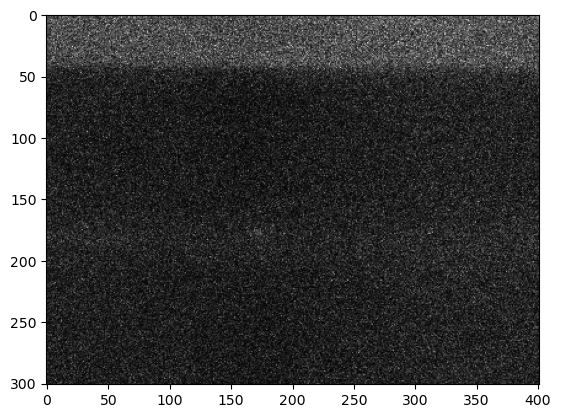

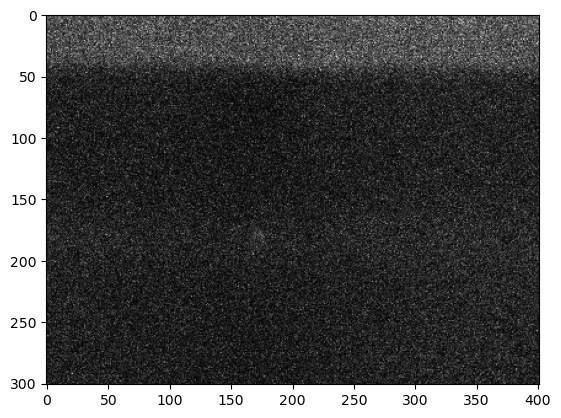

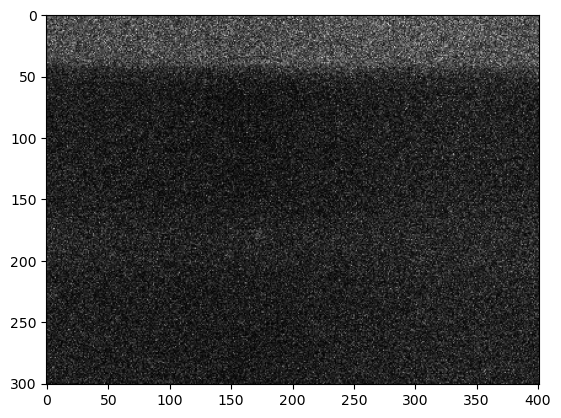

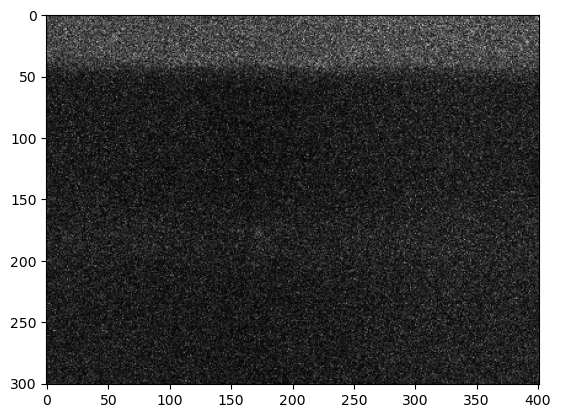

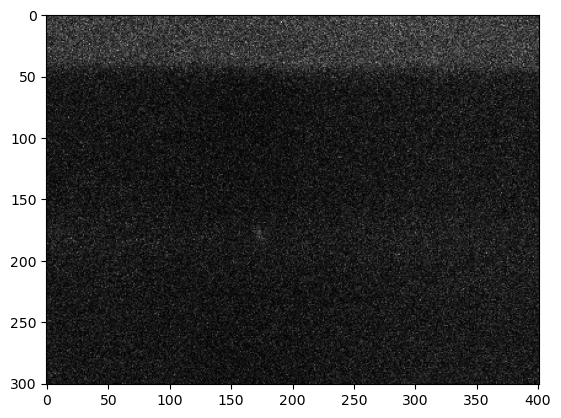

...

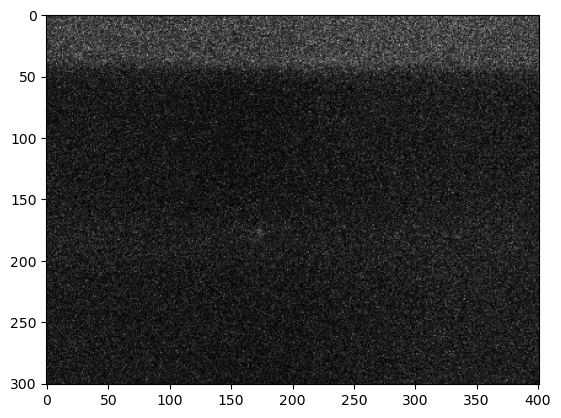

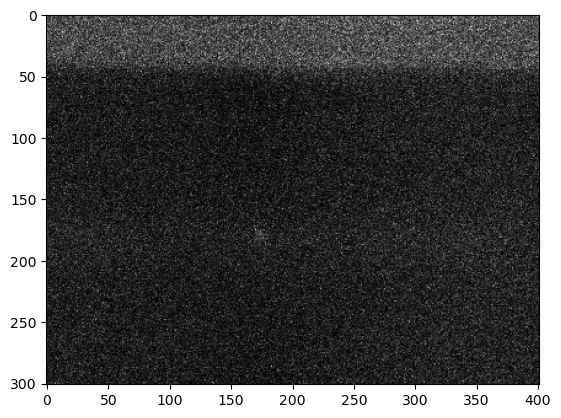

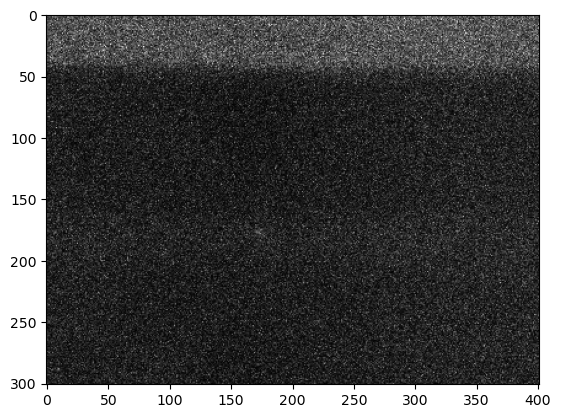

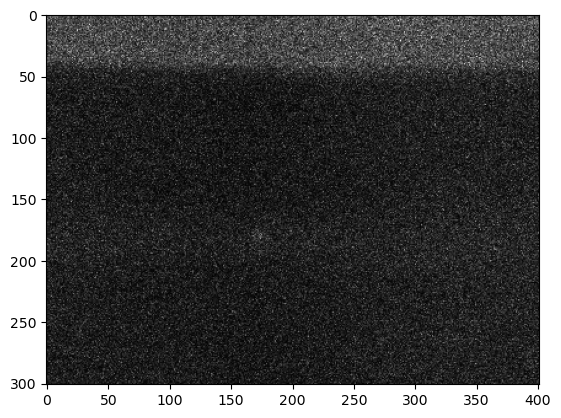

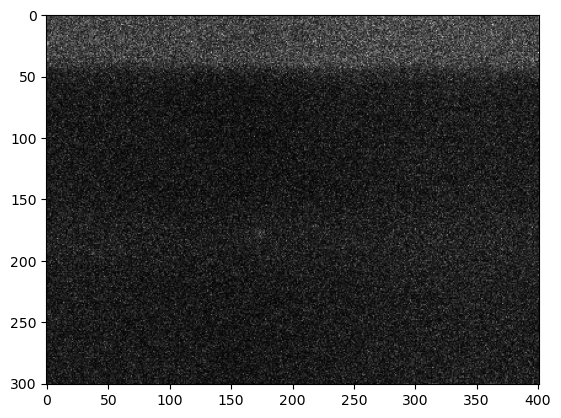

In [372]:
for image in control:
    plt.imshow(image, cmap='gray')
    plt.show()

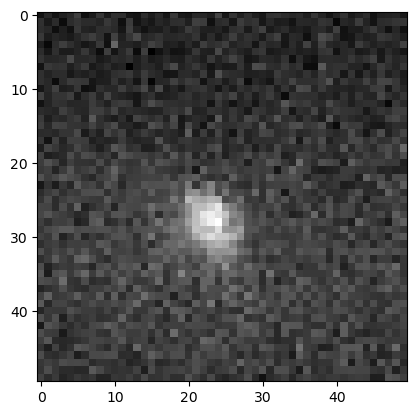

In [377]:
plt.imshow(np.mean(data,axis=0), cmap='gray')
plt.show()

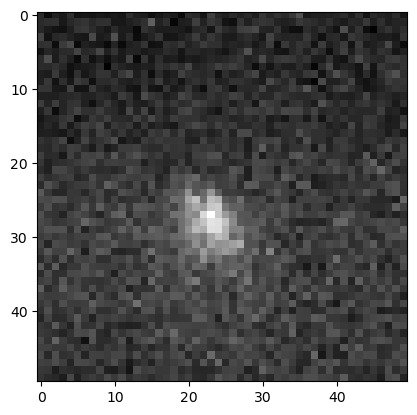

In [378]:
plt.imshow(np.mean(control,axis=0), cmap='gray')
plt.show()

In [406]:
plt.plot(np.mean(control,axis=0)[178])

IndexError: index 178 is out of bounds for axis 0 with size 50

### time of flight fitting

In [619]:
averages = 30
ms = 1e-3

# image_stack = [np.mean(control[i:averages+i],axis=0) for i in range(steps)]
image_stack = [np.mean(data[i*averages:averages*(1+i)],axis=0) for i in range(steps)]

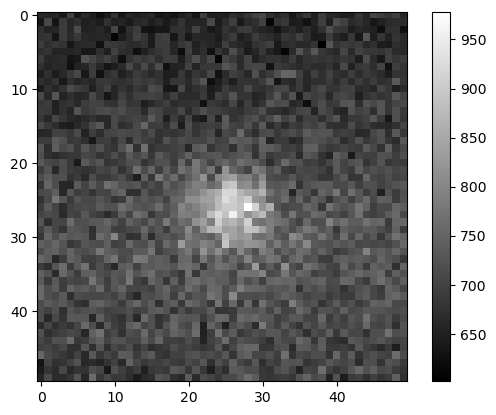

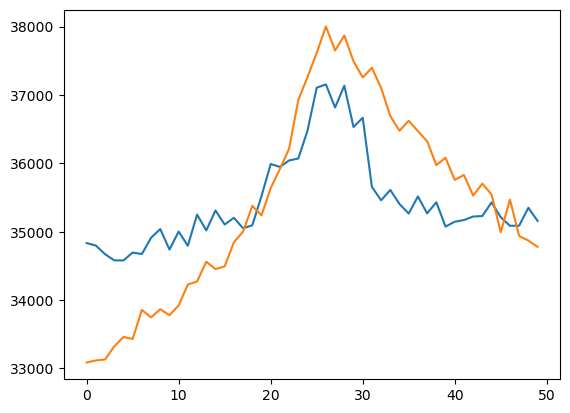

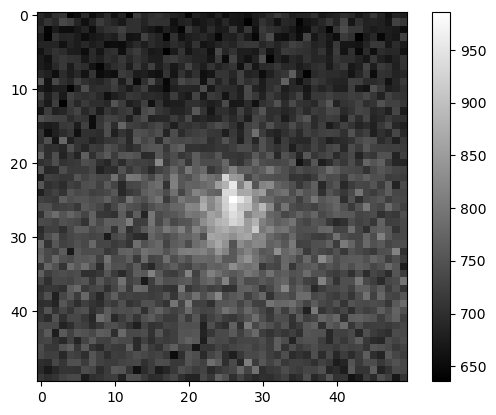

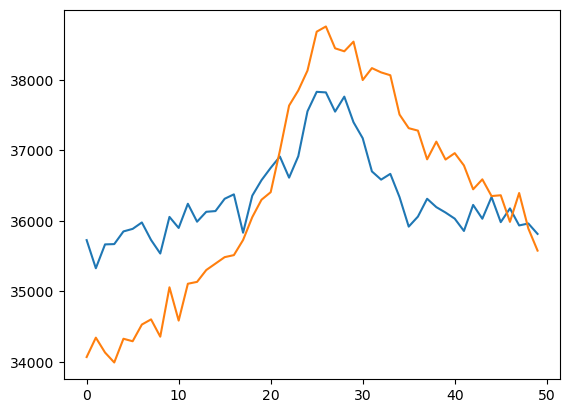

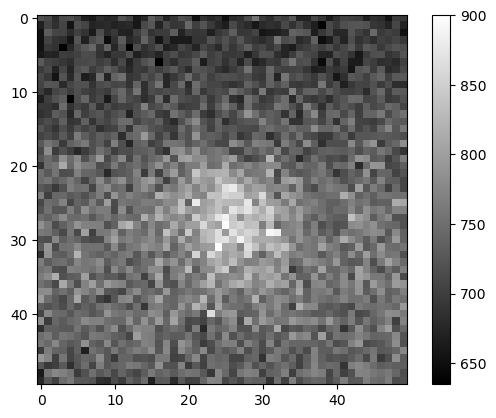

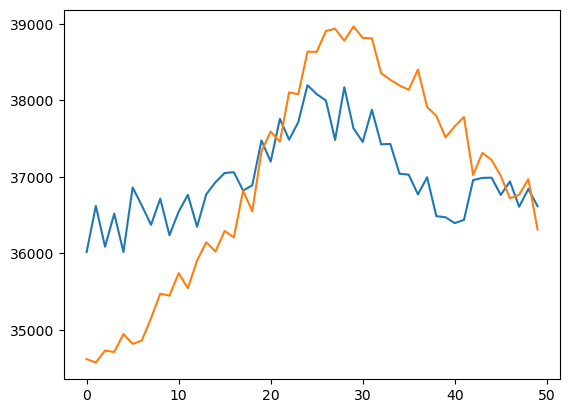

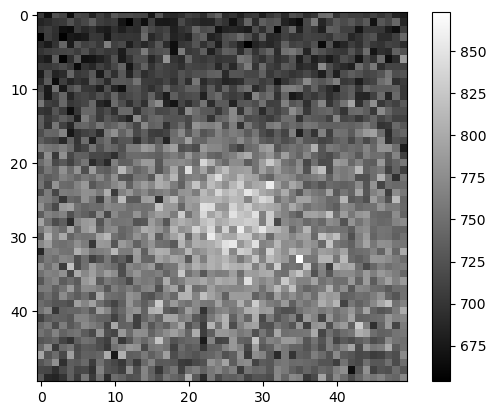

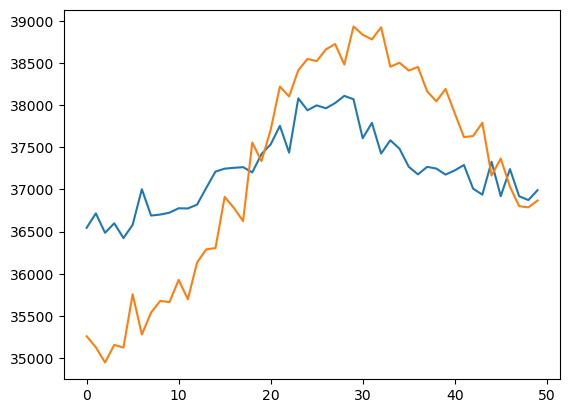

In [620]:
for image in image_stack:
    plt.imshow(image, cmap='gray')
    plt.colorbar()
    plt.show()
    plt.plot(np.sum(image,axis=0))
    plt.plot(np.sum(image,axis=1))
    plt.show()

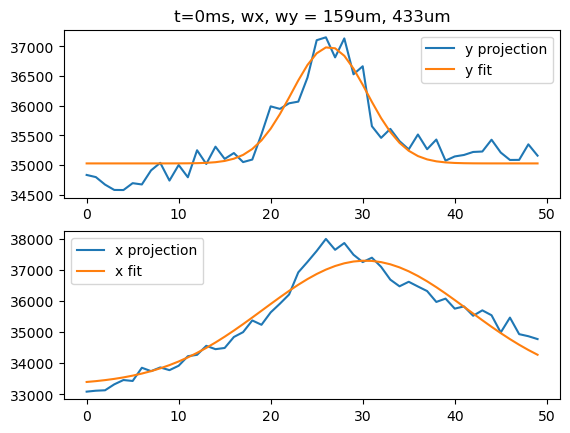

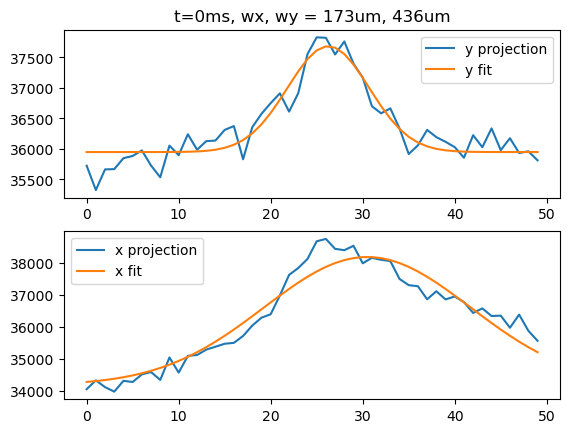

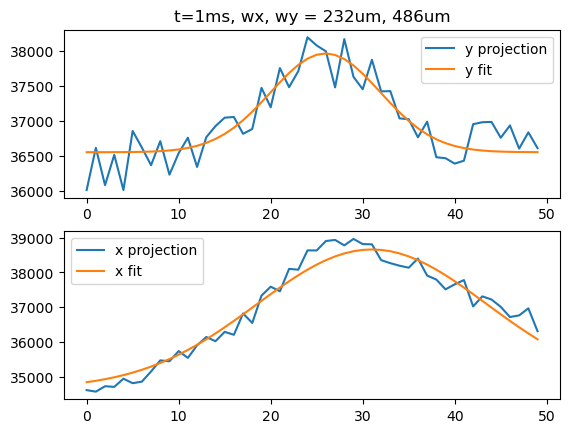

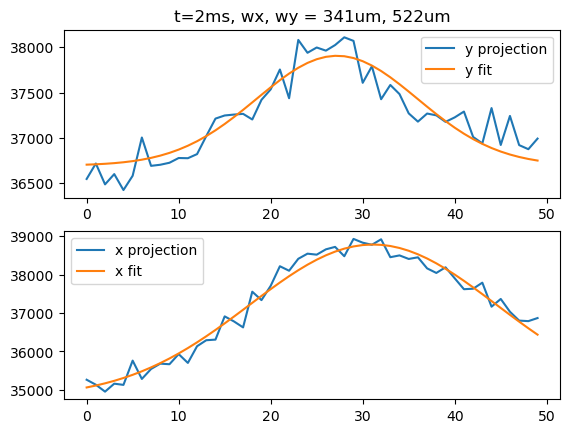

In [622]:
# 1D fits to the projections

waists_x = []
waists_y = []

x = range(image.shape[0])
y = range(image.shape[1])

def model(x, a, x0, w0, b):
    return a*np.exp(-2*((x-x0)/w0)**2) + b

for t,image in zip(timesteps,image_stack):

    xdata = np.sum(image, axis=0)
    
    # amplitude, x/y0, wx/y, offset
    initial_guess = (1000,25,4,33000)
    upper_bounds = [4000,40,30,38000]
    lower_bounds = [500,10,2,10000]

    popt, pcov = curve_fit(model, x, xdata, p0=initial_guess, 
                           bounds=[lower_bounds,upper_bounds])

    xdata_fitted = model(x, *popt)

    waists_x.append(popt[2])
    
    ydata = np.sum(image, axis=1)
    
    # amplitude, x/y0, wx/y, offset
    initial_guess = (1000,25,10,35000)
    upper_bounds = [4000,40,40,38000]
    lower_bounds = [500,10,2,10000]

    popt, pcov = curve_fit(model, y, ydata, p0=initial_guess, 
                           bounds=[lower_bounds,upper_bounds])

    ydata_fitted = model(y, *popt)
    
    waists_y.append(popt[2])
        
    fig, axes = plt.subplots(nrows=2)
    ax,ax2 = axes
    ax.set_title(f"t={t/ms:.0f}ms, wx, wy = "+
                 f"{waists_x[-1]/pixels_per_um:.0f}um, {waists_y[-1]/pixels_per_um:.0f}um")
    ax.plot(x,xdata,label='y projection')
    ax.plot(x,xdata_fitted,label='y fit')
    ax.legend()
    ax2.plot(y,ydata,label='x projection')
    ax2.plot(y,ydata_fitted,label='x fit')
    ax2.legend()
    plt.show()
    
#     cax=ax.imshow(data1d.reshape(*image.shape), cmap=plt.cm.jet, origin='lower',
#         extent=(x.min(), x.max(), y.min(), y.max()))
#     ax.contour(x, y, data_fitted.reshape(*image.shape), 8, colors='w')
#     fig.colorbar(cax)
#     plt.show()

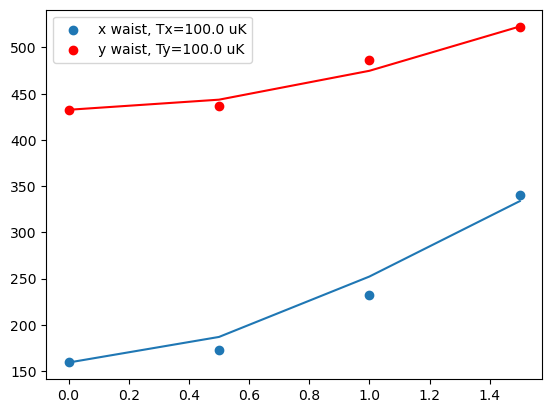

In [637]:
## fit by eye
Tx = 1e-4 # 100 uK

wx0 = ppm(waists_x[0])
wx = lambda t: wx0*np.sqrt(1+4*kB*Tx*t**2/(mRb*wx0**2))

plt.plot(timesteps/ms,wx(timesteps)*1e6)
plt.scatter(timesteps/ms, [ppm(w)*1e6 for w in waists_x],label=f"x waist, Tx={Tx*1e6} uK")

Ty = 1.0e-4 # 100 uK
wy0 = ppm(waists_y[0])
wy = lambda t: wy0*np.sqrt(1+4*kB*Ty*t**2/(mRb*wy0**2))

plt.plot(timesteps/ms,wy(timesteps)*1e6,color='red')
plt.scatter(timesteps/ms, [ppm(w)*1e6 for w in waists_y],color='red',label=f"y waist, Ty={Ty*1e6} uK")
plt.legend()

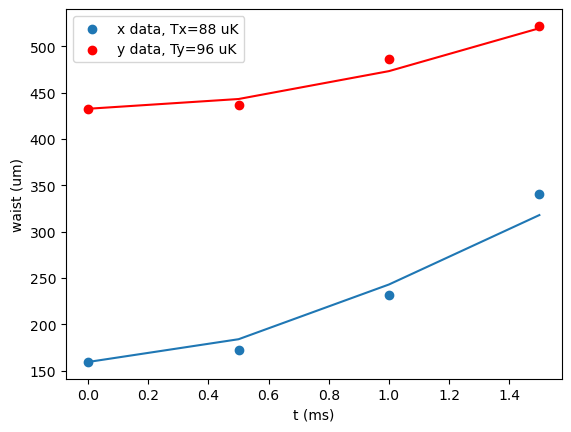

In [663]:
# rigorous fit

waists_x_m = np.array([ppm(x) for x in waists_x])
waists_y_m = np.array([ppm(y) for y in waists_y])

def xmodel(t, Tx):
    return wx0*np.sqrt(1+4*kB*Tx*t**2/(mRb*wx0**2))

def ymodel(t, Ty):
    return wy0*np.sqrt(1+4*kB*Ty*t**2/(mRb*wy0**2))
    
initial_guess = (5e-5)
bounds = [1e-6,5e-4]

fig, ax = plt.subplots()

# time in seconds, waists in meters
popt, pcov = curve_fit(xmodel, timesteps, waists_x_m, p0=initial_guess, 
                       bounds=bounds)

Tx = popt[0]

ax.scatter(timesteps/ms, waists_x_m*1e6, label=f'x data, Tx={Tx*1e6:.0f} uK')
ax.plot(timesteps/ms, xmodel(timesteps, *popt)*1e6)

popt, pcov = curve_fit(ymodel, timesteps, waists_y_m, p0=initial_guess, 
                       bounds=bounds)

Ty = popt[0]

ax.scatter(timesteps/ms, waists_y_m*1e6, label=f'y data, Ty={Ty*1e6:.0f} uK',color='red')
ax.plot(timesteps/ms, ymodel(timesteps, *popt)*1e6,color='red')
ax.set_xlabel("t (ms)")
ax.set_ylabel("waist (um)")
ax.legend()

In [644]:
ymodel(timesteps,1e-4)

array([0.00043262, 0.00044354, 0.00047478, 0.00052271])

In [645]:
type([1,2,3])==list

True

## 2D Gaussian fit examples
credit: https://stackoverflow.com/questions/21566379/fitting-a-2d-gaussian-function-using-scipy-optimize-curve-fit-valueerror-and-m

a=600.00, x0=24.26, y0=25.00, sx=2.00, sy=2.00, theta=6.28, offset=707.73


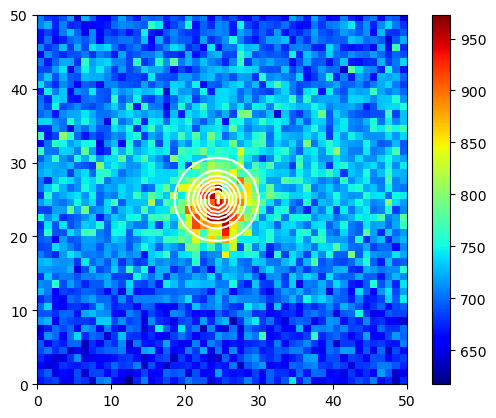

a=600.00, x0=23.99, y0=25.19, sx=2.00, sy=2.00, theta=6.25, offset=724.63


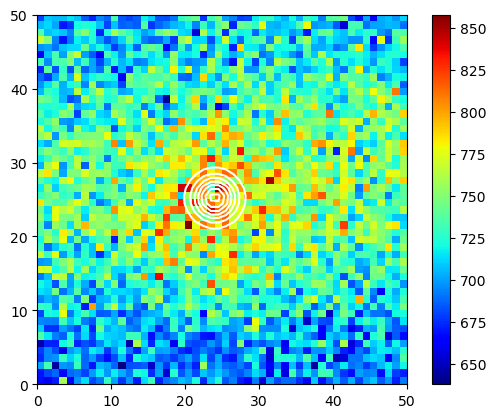

In [547]:
## 2D fit the waists for each MOT expansion time

waists_x = []
waists_y = []

# amplitude, xo, yo, sigma_x, sigma_y, theta, offset
initial_guess = (1000,20,35,3,3,0,650)
upper_bounds = [1200,30,45,10,10,2*np.pi,1000]
lower_bounds = [600,10,25,2,2,0,600]

for image in image_stack:

    data1d = image.ravel()

    # Create x and y indices
    x = np.linspace(0, image.shape[0], image.shape[1])
    y = np.linspace(0, image.shape[0], image.shape[1])
    x, y = np.meshgrid(x, y)

    popt, pcov = curve_fit(twoD_Gaussian, (x, y), data1d, p0=initial_guess, 
                           bounds=[lower_bounds,upper_bounds])

    data_fitted = twoD_Gaussian((x, y), *popt)
    print("a={:.2f}, x0={:.2f}, y0={:.2f}, sx={:.2f}, sy={:.2f}, theta={:.2f}, offset={:.2f}".format(
          *popt))
#     print(f"theta mod 2pi = {popt[-2]%(2*np.pi)}")
    waists_x.append(2*popt[3]) # the Gaussian beam waist = 2*sigma
    waists_y.append(2*popt[4])
    fig, ax = plt.subplots(1, 1)
    cax=ax.imshow(data1d.reshape(*image.shape), cmap=plt.cm.jet, origin='lower',
        extent=(x.min(), x.max(), y.min(), y.max()))
    ax.contour(x, y, data_fitted.reshape(*image.shape), 8, colors='w')
    fig.colorbar(cax)
    plt.show()

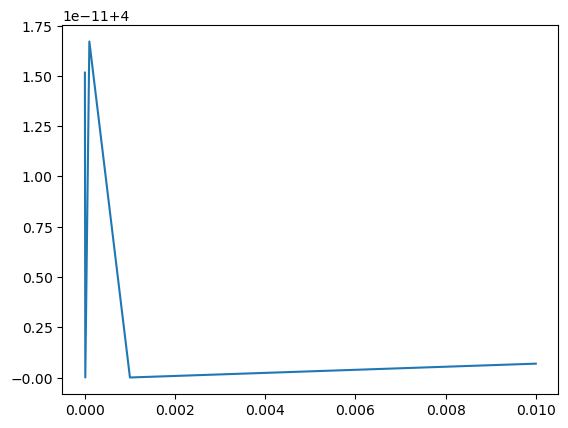

In [466]:
# plt.plot(timesteps,waists_x)
plt.plot(timesteps,waists_y)
# plt.ylim((-0.1*min(min(waists_x),min(waists_y)),1.1*max(max(waists_x),max(waists_y))))

In [ ]:
# fit the waist vs time curve to get a temperature

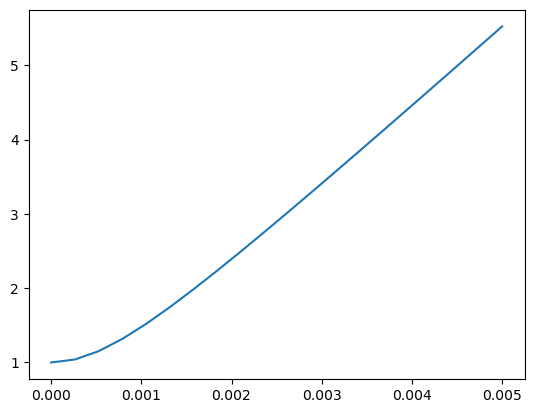

In [503]:
# what drop times to use - make a guess at rough temperature
kB = 1.38e-23
mRb = 1.44316060e-25
T = 1e-4 # 100 uK
wr0 = 1.8e-4
# wr = lambda t: wr0*np.sqrt(1+4*kB*T*t**2/(mRb*wr0**2)) # MOT half-width
wr = lambda t: np.sqrt(1+4*kB*T*t**2/(mRb*wr0**2)) # MOT fractional half-width

timesteps = np.linspace(0,5,20)*ms
plt.plot(timesteps,wr(timesteps))

a=242.06, x0=23.40, y0=29.03, sx=3.01, sy=4.00, theta=16861.49, offset=704.80
theta mod 2pi = 3.708215661144429


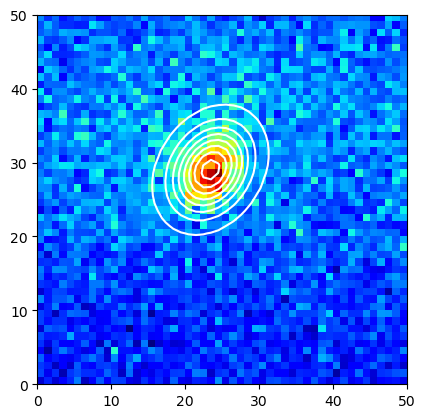

In [398]:
def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()

# create data
# data = twoD_Gaussian((x, y), 3, 100, 100, 20, 40, 0, 10)
# image = np.mean(control,axis=0)
image = np.mean(data,axis=0)
data1d = (image).ravel()

# Create x and y indices
x = np.linspace(0, image.shape[0], image.shape[1])
y = np.linspace(0, image.shape[0], image.shape[1])
x, y = np.meshgrid(x, y)

# # plot twoD_Gaussian data generated above
# plt.figure()
# plt.imshow(data.reshape(*image.shape))
# plt.colorbar()

# amplitude, xo, yo, sigma_x, sigma_y, theta, offset
initial_guess = (1000,25,25,3,3,0,0)

# data_noisy = data + 0.2*np.random.normal(size=data.shape)

popt, pcov = curve_fit(twoD_Gaussian, (x, y), data1d, p0=initial_guess)

data_fitted = twoD_Gaussian((x, y), *popt)
print("a={:.2f}, x0={:.2f}, y0={:.2f}, sx={:.2f}, sy={:.2f}, theta={:.2f}, offset={:.2f}".format(
      *popt))
print(f"theta mod 2pi = {popt[-2]%(2*np.pi)}")
fig, ax = plt.subplots(1, 1)
#ax.hold(True) For older versions. This has now been deprecated and later removed
ax.imshow(data1d.reshape(*image.shape), cmap=plt.cm.jet, origin='lower',
    extent=(x.min(), x.max(), y.min(), y.max()))
ax.contour(x, y, data_fitted.reshape(*image.shape), 8, colors='w')
plt.show()

In [ ]:
mRb = 

def wr(t,T,wr):
    """ size of cloud. 
        'wr': the width at t = 0
    """
    m = mRb # is m the mass of one atom, or the whole cloud?
    
    return wr*(1 + 4*kB*T*t**2/(mRb*wr**2))**.5